# Part A: Univariate Linear Regression
<hr>

> # Description

- "Experiment on univariate linear regression."
- "You are allowed to pick only 2 features from the dataset and will train an univariate linear regression for each of them."

<br>
<br>

 # Importing the Libraries into a Dataframe

In [1]:
# Importing the libraries

import pandas as pd
import numpy as np
import altair as alt

import matplotlib.pyplot as plt
import seaborn as sns

import missingno as msno

# Hide warnings

import warnings
warnings.filterwarnings('ignore')


In [2]:
# Load the data into a dataframe called cancer_df.

cancer_train_df = pd.read_csv('https://raw.githubusercontent.com/modernth3ory/Cancer-Dataset/main/cancer_us_county-training.csv')
cancer_test_df = pd.read_csv('https://raw.githubusercontent.com/modernth3ory/Cancer-Dataset/main/cancer_us_county-training.csv')


In [3]:
# Concatenate the two dataframes into one.

cancer_df = pd.concat([cancer_train_df, cancer_test_df], ignore_index=True)


<br>
<br>
<br>
<br>
<br>
<br>
<br>

 # Exploring the Dataset


In [4]:
# Display the first 5 rows of the dataset.

cancer_df.head()


,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,Id
0,88.000000,40,261.0,561.400000,29090,13352,26.8,2771.120431,"[22640, 34218.1]",39.8,...,32.0,47.5,32.9,99.693045,0.044920,0.000000,0.000000,55.499459,6.838710,0
1,73.000000,35,167.3,345.600000,29782,21903,38.8,0.000000,"[22640, 34218.1]",32.3,...,18.8,45.3,34.1,94.791383,1.649850,0.063631,2.854286,52.818296,4.799131,1
2,292.000000,124,191.0,468.400000,41955,48985,15.5,0.000000,"(40362.7, 42724.4]",42.2,...,44.9,34.5,16.0,95.102348,1.741749,0.376429,0.445611,50.560800,3.996826,2
3,1962.667684,7,165.4,453.549422,55378,3007,11.1,0.000000,"(54545.6, 61494.5]",41.6,...,49.6,30.1,15.2,85.833870,0.933677,0.160979,7.244044,52.565181,3.291536,3
4,43.000000,20,160.6,349.700000,26309,8551,35.3,0.000000,"[22640, 34218.1]",43.9,...,30.4,45.1,24.5,24.535525,73.223736,0.394100,1.396239,33.641208,3.166561,4


In [5]:
# Display the last 5 rows of the dataset.

cancer_df.tail()


,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,Id
4871,389.000000,157,185.3,456.600000,65485,83199,7.7,0.000000,"(61494.5, 125635]",40.1,...,55.1,24.2,11.3,91.187608,4.445537,1.405213,0.858126,60.095060,5.175689,3041
4872,286.000000,117,196.7,492.400000,42477,46222,16.9,281.251352,"(40362.7, 42724.4]",40.8,...,46.2,34.9,18.8,90.130702,5.943936,0.472935,0.485833,51.648588,4.651829,3042
4873,103.000000,42,204.1,506.700000,40339,18201,21.3,0.000000,"(37413.8, 40362.7]",38.6,...,34.4,36.9,20.6,65.463178,30.550955,0.645909,0.104891,49.758980,4.344104,3043
4874,1962.667684,23,171.1,453.549422,39764,8856,16.7,0.000000,"(37413.8, 40362.7]",43.8,...,37.3,40.0,21.3,94.625317,0.154508,0.629070,0.684251,49.880605,6.210826,3045
4875,219.000000,89,179.7,449.100000,40801,37585,17.2,0.000000,"(40362.7, 42724.4]",42.9,...,37.5,39.4,21.8,91.393432,3.381528,0.055305,3.149772,49.892641,6.549178,3046


In [6]:
# Display the number of rows and columns in the dataset.

cancer_df.shape


(4876, 35)

In [7]:
# Display the Data Types of the dataset.

cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4876 entries, 0 to 4875
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              4876 non-null   float64
 1   avgDeathsPerYear         4876 non-null   int64  
 2   TARGET_deathRate         4876 non-null   float64
 3   incidenceRate            4876 non-null   float64
 4   medIncome                4876 non-null   int64  
 5   popEst2015               4876 non-null   int64  
 6   povertyPercent           4876 non-null   float64
 7   studyPerCap              4876 non-null   float64
 8   binnedInc                4876 non-null   object 
 9   MedianAge                4876 non-null   float64
 10  MedianAgeMale            4876 non-null   float64
 11  MedianAgeFemale          4876 non-null   float64
 12  Geography                4876 non-null   object 
 13  AvgHouseholdSize         4876 non-null   float64
 14  PercentMarried          

In [8]:
# Display a description of the dataset.

cancer_df.describe()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,Id
count,4876.000000,4876.000000,4876.000000,4876.000000,4876.000000,4.876000e+03,4876.000000,4876.000000,4876.000000,4876.000000,...,4876.000000,4876.000000,4876.000000,4876.000000,4876.000000,4876.000000,4876.000000,4876.000000,4876.000000,4876.000000
mean,587.171930,180.592699,178.848482,448.308247,47028.427810,9.851579e+04,16.854348,166.019192,45.313782,39.640853,...,41.242453,36.275718,19.234824,83.776008,9.043586,1.230949,1.947961,51.216669,5.627447,1523.789171
std,1236.321073,438.428170,27.535627,53.242406,11918.164058,2.744990e+05,6.387743,563.756000,45.048552,5.217111,...,9.365472,7.822545,6.093458,16.274293,14.360429,2.557848,3.541335,6.500587,1.966055,874.815934
min,6.000000,3.000000,66.300000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,...,13.500000,11.200000,2.600000,10.199155,0.000000,0.000000,0.000000,22.992490,0.000000,0.000000
25%,76.000000,28.000000,161.400000,420.300000,38871.000000,1.154300e+04,12.100000,0.000000,37.800000,36.400000,...,34.600000,30.900000,15.000000,77.339000,0.634382,0.246832,0.288746,47.826087,4.516129,775.000000
50%,172.500000,62.000000,178.100000,453.549422,45186.500000,2.694250e+04,15.900000,0.000000,41.000000,39.600000,...,41.300000,36.400000,18.800000,90.121405,2.302054,0.550713,0.798971,51.662077,5.366485,1512.500000
75%,522.000000,151.000000,195.300000,482.000000,52493.000000,6.964800e+04,20.400000,92.591080,44.100000,42.500000,...,47.600000,41.500000,23.100000,95.465300,10.463576,1.207631,2.107185,55.333729,6.458604,2280.000000
max,24965.000000,9445.000000,293.900000,1014.200000,125635.000000,5.238216e+06,47.400000,9762.308998,624.000000,64.700000,...,70.700000,65.100000,46.600000,100.000000,84.866024,42.619425,41.930251,78.075397,18.556701,3046.000000


> ##### Insights

- The dataset contains 34 columns.

- Dataset contains both categorical and numerical variables, with NaN values in three columns.

<br>

- There columns containing object variables are: [ "Geography", "binnedInc" ]. 

- The other columns consist of int64 or float64 variables.


<br>
<br>
<br>
<br>
<br>
<br>
<br>

 # Data Cleaning


##### Identifying and Amending NaN values

In [9]:
# Display the missing values in the dataset.

cancer_df.isnull().sum()


avgAnnCount                   0
avgDeathsPerYear              0
TARGET_deathRate              0
incidenceRate                 0
medIncome                     0
popEst2015                    0
povertyPercent                0
studyPerCap                   0
binnedInc                     0
MedianAge                     0
MedianAgeMale                 0
MedianAgeFemale               0
Geography                     0
AvgHouseholdSize              0
PercentMarried                0
PctNoHS18_24                  0
PctHS18_24                    0
PctSomeCol18_24            3652
PctBachDeg18_24               0
PctHS25_Over                  0
PctBachDeg25_Over             0
PctEmployed16_Over          244
PctUnemployed16_Over          0
PctPrivateCoverage            0
PctPrivateCoverageAlone    1000
PctEmpPrivCoverage            0
PctPublicCoverage             0
PctPublicCoverageAlone        0
PctWhite                      0
PctBlack                      0
PctAsian                      0
PctOther

<AxesSubplot:>

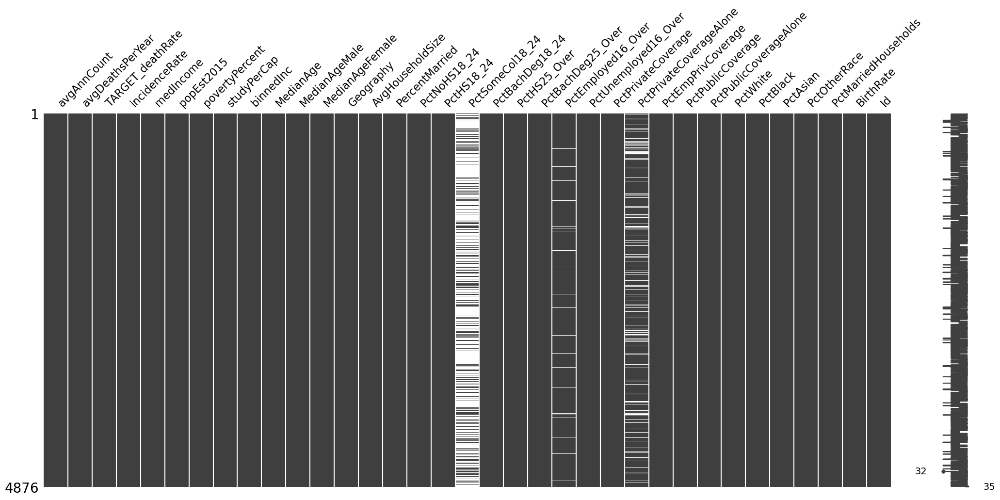

In [10]:
# Visualise the missing values with missingno.

msno.matrix(cancer_df)


In [11]:
# Drop "PctSomeCol18_24", as the majority of values are NaN.

cancer_df.drop(columns=['PctSomeCol18_24'],axis=1,inplace=True)

In [12]:
# Fill NaN values with the mean of the column for PctPrivateCoverage, PctEmployed16_Over.

cancer_df['PctPrivateCoverageAlone'].fillna(cancer_df['PctPrivateCoverageAlone'].mean(), inplace=True)
cancer_df['PctEmployed16_Over'].fillna(cancer_df['PctEmployed16_Over'].mean(), inplace=True)

> ##### Insights

Three columns contain NaN values: 

- "PctSomeCol18_24"

- "PctEmployed16_Over"

- "PctPrivateCoverageAlone"

<br>

- The column "PctSomeCol18_24" was dropped from the dataset, as it contains most NaN values.

- The columns "PctEmployed16_Over" and "PctPrivateCoverageAlone" were filled with the mean of the column.

- While "PctPrivateCoverageAlone" had 1/5ths of its values missing, the distribution (performed in subsequent section), suggested that the mean was a good choice for filling the NaN values.

<br>


<br>
<br>
<br>
<br>
<br>
<br>
<br>

##### Identifying Duplicate Rows

In [13]:
# Determine whether the data contains any duplicate entries.

cancer_df.duplicated().sum()


2438

> ##### Insights

- There are no duplicate rows in the dataset.

<br>


<br>
<br>
<br>
<br>
<br>
<br>
<br>

##### Investigating Object Values

In [14]:
# Check the amount of values for each column with the object data type.

for i in cancer_df.select_dtypes(include=object):
    print(cancer_df[i].value_counts(ascending=True))

[22640, 34218.1]      470
(51046.4, 54545.6]    472
(42724.4, 45201]      476
(61494.5, 125635]     480
(48021.6, 51046.4]    480
(37413.8, 40362.7]    484
(45201, 48021.6]      498
(54545.6, 61494.5]    504
(34218.1, 37413.8]    504
(40362.7, 42724.4]    508
Name: binnedInc, dtype: int64
Jackson County, Kentucky         2
Morris County, Texas             2
Dallas County, Arkansas          2
Berrien County, Michigan         2
New Castle County, Delaware      2
                                ..
Emmons County, North Dakota      2
Monroe County, New York          2
Hall County, Nebraska            2
Madison County, Georgia          2
Yadkin County, North Carolina    2
Name: Geography, Length: 2438, dtype: int64


<AxesSubplot:title={'center':'US State Locations of Data Origin.'}>

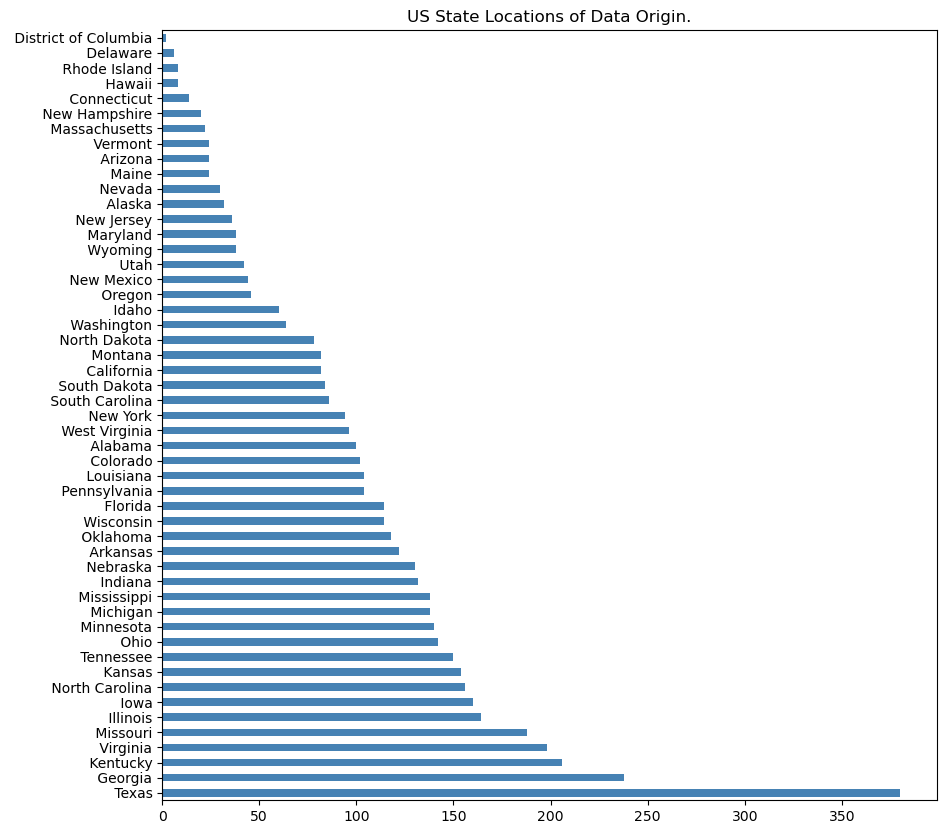

In [15]:
# Count the most frequent words in the column "Geography", after the ",".

from collections import Counter

cancer_df['Geography'].str.split(',').apply(lambda x: Counter(x[1:]).most_common(1)[0][0]).value_counts().plot(kind='barh',figsize=(10,10), title='US State Locations of Data Origin.', color='steelblue')


In [16]:
# As Geography will not be incorporated in the Univariate Linear Regression, it will be dropped. This will be utilised for Part C, when conducting feature engineering.
# Drop the "binnedInc" column.

cancer_df.drop(columns=['Geography', 'binnedInc'],axis=1,inplace=True)


> ##### Insights

- The "Geography" column contains a large spread of values from varying states in the US. This may provide some application toward discerning cancer incidence down the track.

- It is difficult to convert the "Geography" column into numerical values, as it's quite diverse.

<br>

- The "binnedInc" column represents (Median income per capita binned by decile), a value already represented by Medianincome. As it is incomplete, it is not a useful feature for the model.

- The "binnedInc" column was dropped from the dataset.

<br>
<br>
<br>
<br>
<br>
<br>
<br>

<br>
<br>
<br>
<br>
<br>
<br>
<br>

##### Visualising and Amending Outliers for the Univariate Linear Regression Model

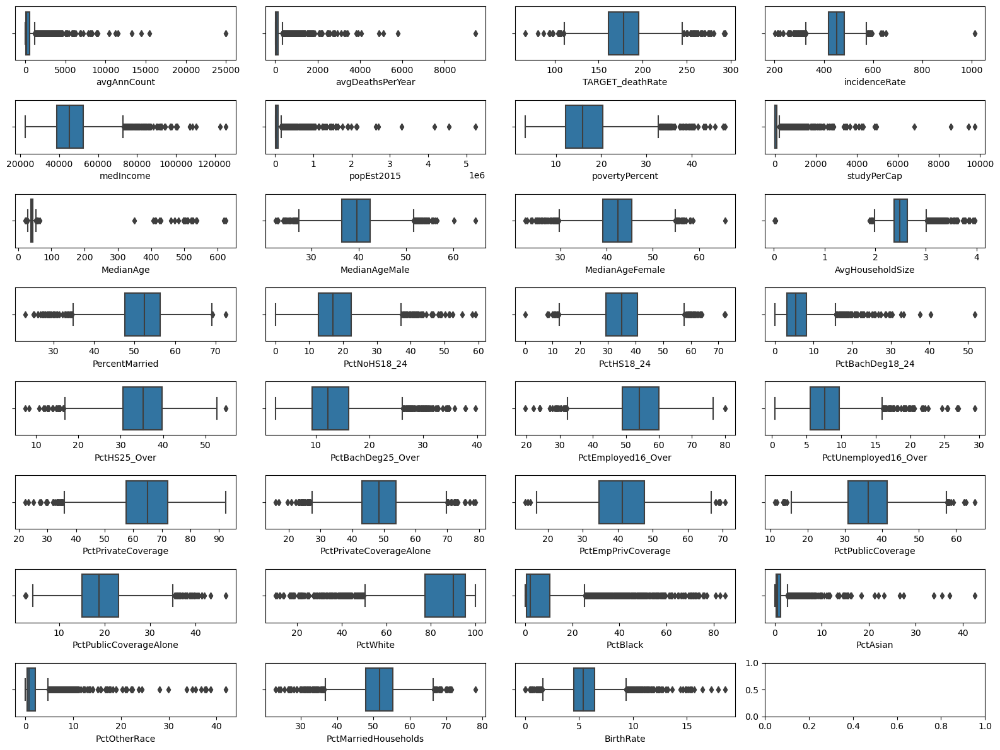

In [17]:
# Visualise the outliers in the data through boxplots.

fig, axes = plt.subplots(8, 4, figsize=(16, 12))
axes = [ax for axes_row in axes for ax in axes_row]
for i, c in enumerate(cancer_df.columns[:-1]):
  plot = sns.boxplot(data=cancer_df, x=c, ax=axes[i])
plt.tight_layout()


##### Visualising the Impact of Outliers on the Univariate Linear Regression Model

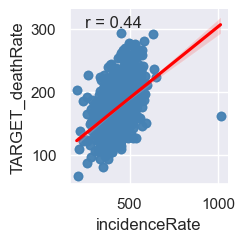

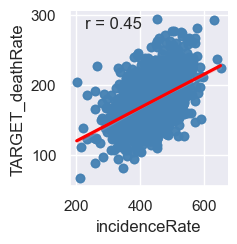

In [18]:
# Compare incidenceRate to the target variable with and without the outlier.
# Create scatter plots of TARGET_deathrate vs incidenceRate.

from scipy import stats

def regplot_with_corr(x, y, **kwargs):
    ax = sns.regplot(x=x, y=y, **kwargs)
    r, _ = stats.pearsonr(x, y)
    ax.annotate(f'r = {r:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes)


sns.set()
cols = ['incidenceRate']
g = sns.PairGrid(cancer_df, y_vars=['TARGET_deathRate'], x_vars=cols, height=2.5)
g.map(regplot_with_corr, color='steelblue', line_kws={'color': 'red'})
plt.show()

# Remove the row from the dataset with an incidenceRate of 1000.

cancer_df_incidenceRate_no_out = cancer_df[cancer_df['incidenceRate'] < 1000]

# Create scatter plots of TARGET_deathrate vs incidenceRate with the outlier removed.

sns.set()
cols = ['incidenceRate']
g = sns.PairGrid(cancer_df_incidenceRate_no_out, y_vars=['TARGET_deathRate'], x_vars=cols, height=2.5)
g.map(regplot_with_corr, color='steelblue', line_kws={'color': 'red'})
plt.show()

> ##### Insights

- While the 1000 count incident outlier affects the correlation coefficient, it must be left in, as it represents a real-world scenario.

<br>
<br>
<br>
<br>
<br>
<br>
<br>

##### Removing Outliers

In [19]:
# Remove all outliers from average deaths per year.

cancer_df = cancer_df[cancer_df['MedianAge'] < 300]




> ##### Insights

- On the other hand, median age outliers >300 must be removed, as they are not representative of the real-world scenario.

<br>
<br>
<br>
<br>
<br>
<br>
<br>

##### Define Dataframe as Cleaned

In [20]:
# Display the new shape of the dataset.

cancer_df.shape

(4828, 32)

In [21]:
# Define new dataframe as cleaned data.

cancer_df_clean = cancer_df


> ### Insights

- As all columns, except "Geography", are numerical, the dataset is ready for analysis.

- Be mindful some missing values are remain in PctEmployed16_Over, and PctPrivateCoverage.

- These will be addressed when exploring outliers.

<br>

<br>
<br>
<br>
<br>
<br>
<br>
<br>

 # Data Analysis


##### Visualising Distribution

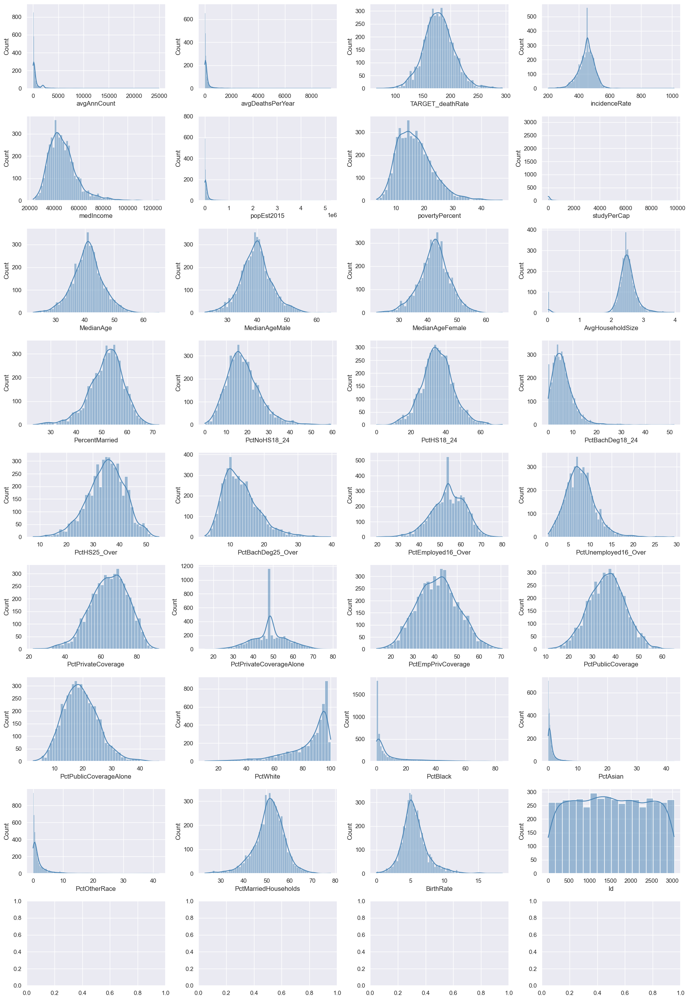

In [22]:
# Visualising distribution of data to determine features to use for a linear regression model without geography and ID.
# "Geography" and "ID" will not be usable distributions.

fig, axes = plt.subplots(9, 4, figsize=(18, 26))
axes = [ax for axes_row in axes for ax in axes_row]
for i, c in enumerate(cancer_df_clean.columns):
    plot = sns.histplot(cancer_df_clean[c], ax=axes[i], kde = True, color = 'steelblue')
plt.tight_layout()


> ### Insights

Normal Distributions:

- Target_deathrate

- incidenceRate

- MedianAgeMale

- MedianAgeFemale

- PctHS18_24

- PctPrivate CoverageAlone

- PctEmpPrivCoverage

- PctPublicCoverage

- PctMarriedHouseholds

<br>

**Note: "PctPrivateCoverageAlone" and "PctEmployed16_Over" are not not accurate represenations, as the mean was inserted for NaN values. Data was kept in the dataset, however as it may be useful for future analysis.**

**They represent useful real-life scenarios**

<br>

<br>
<br>
<br>
<br>
<br>
<br>
<br>

##### Discerning Correlation between features and the Target Variable (Target_deathrate)

<AxesSubplot:>

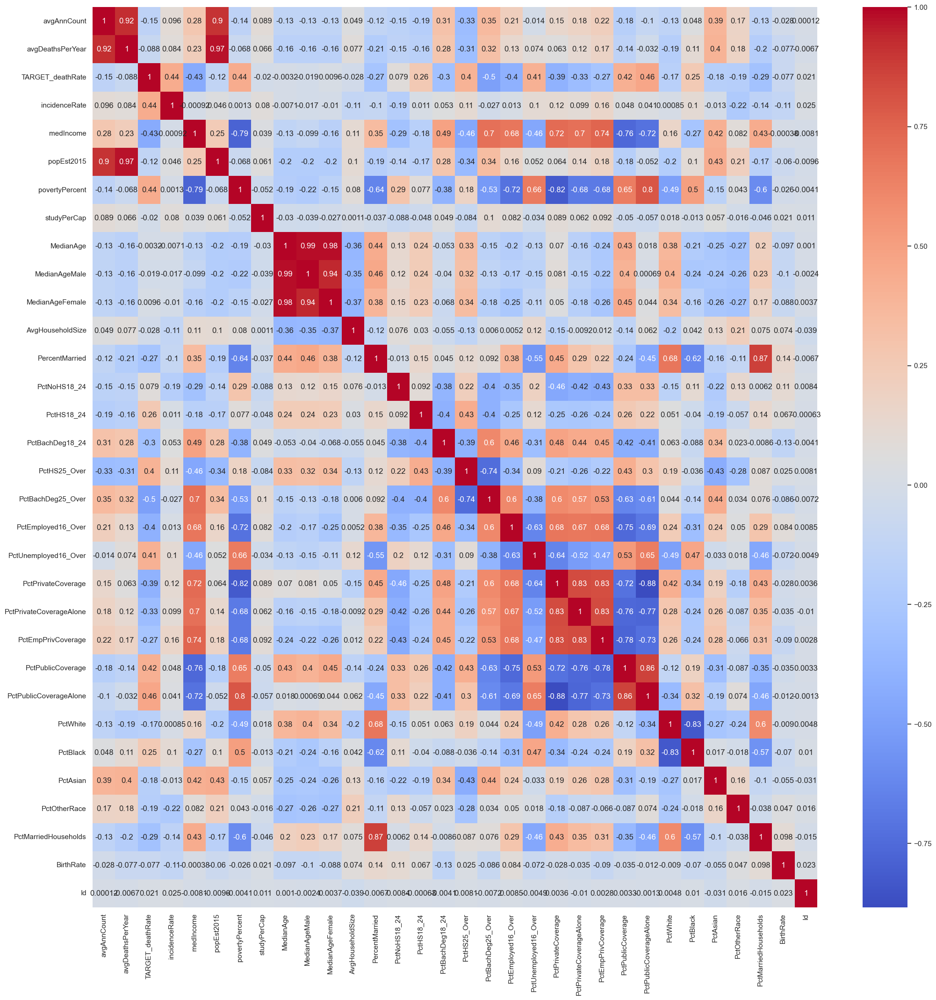

In [23]:
# Visualise correlation between the features using a heatmap.

plt.figure(figsize=(25,25))
sns.heatmap(cancer_df_clean.corr(), annot=True, cmap='coolwarm')

In [24]:
# Display the correlation between the features and the target variable.

cancer_df_clean.corr()['TARGET_deathRate'].sort_values(ascending=False)


TARGET_deathRate           1.000000
PctPublicCoverageAlone     0.463189
povertyPercent             0.437678
incidenceRate              0.436983
PctPublicCoverage          0.415472
PctUnemployed16_Over       0.406530
PctHS25_Over               0.403450
PctHS18_24                 0.263929
PctBlack                   0.251927
PctNoHS18_24               0.078585
Id                         0.021099
MedianAgeFemale            0.009630
MedianAge                 -0.003220
MedianAgeMale             -0.018609
studyPerCap               -0.019891
AvgHouseholdSize          -0.027757
BirthRate                 -0.077268
avgDeathsPerYear          -0.088457
popEst2015                -0.123278
avgAnnCount               -0.147444
PctWhite                  -0.172409
PctAsian                  -0.178995
PctOtherRace              -0.185341
PercentMarried            -0.266066
PctEmpPrivCoverage        -0.270133
PctMarriedHouseholds      -0.291291
PctBachDeg18_24           -0.295475
PctPrivateCoverageAlone   -0

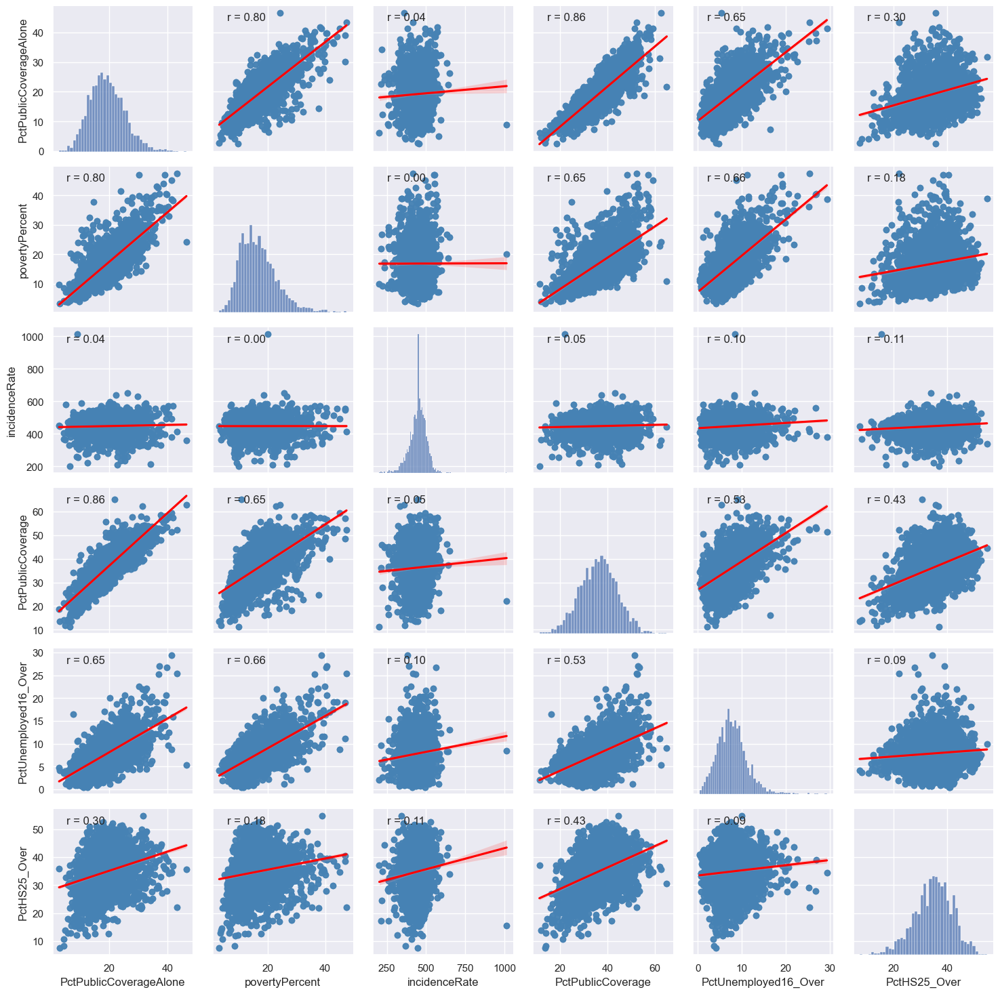

In [25]:
# Taking the top 6 features with the highest correlation with the target variable, and visualising the their relationships.

sns.set()
cols = ['PctPublicCoverageAlone', 'povertyPercent', 'incidenceRate', 'PctPublicCoverage', 'PctUnemployed16_Over', 'PctHS25_Over']
g = sns.PairGrid(cancer_df_clean[cols], size=2.5)
g.map_diag(sns.histplot)
g.map_offdiag(regplot_with_corr, color='steelblue', line_kws={'color': 'red'})
plt.show()

> ### Insights

Most Positively correlated features between the target variable and the other features:

- PctPublicCoverageAlone

- povertyPercent

- incidenceRate

- PctPublicCoverage

- PctUnemployed16_Over

- PctHS25_Over

<br>

Most negatively correlated features between the target variable and the other features:

- PctBachDeg25_Over

- medIncome

- PctEmployed16_Over

- PctPrivateCoverage





<br>

<br>
<br>
<br>
<br>
<br>
<br>
<br>

##### Visualising Positively and Negatively Correlated Features of the Target Variable

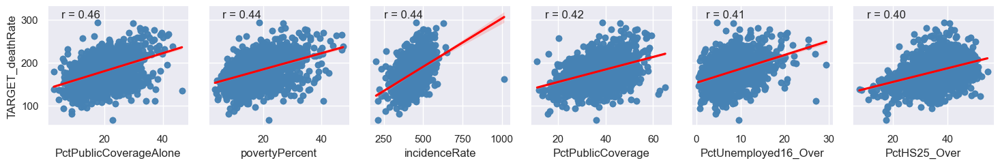

,TARGET_deathRate,PctPublicCoverageAlone,povertyPercent,incidenceRate,PctPublicCoverage,PctUnemployed16_Over,PctHS25_Over
0,261.0,32.9,26.8,561.400000,47.5,12.3,43.4
1,167.3,34.1,38.8,345.600000,45.3,11.5,35.5
2,191.0,16.0,15.5,468.400000,34.5,10.6,43.5
3,165.4,15.2,11.1,453.549422,30.1,5.8,32.5
4,160.6,24.5,35.3,349.700000,45.1,14.6,40.6


In [26]:
# Create scatter plots for the most correlated features with the target variable.
# Create scatter plots of TARGET_deathrate vs PctPublicCoverageAlone, povertyPercent,incidenceRate, PctPublicCoverage, PctUnemployed16_Over, PctHS25_Over.

sns.set()
cols = ['PctPublicCoverageAlone', 'povertyPercent', 'incidenceRate', 'PctPublicCoverage', 'PctUnemployed16_Over', 'PctHS25_Over']
g = sns.PairGrid(cancer_df_clean, y_vars=['TARGET_deathRate'], x_vars=cols, height=2.5)
g.map(regplot_with_corr, color='steelblue', line_kws={'color': 'red'})
plt.show()

# Create a new dataframe with the features that have a correlation of 0.5 or greater with the target variable.

cancer_df_clean_pos_cor = cancer_df_clean[['TARGET_deathRate','PctPublicCoverageAlone','povertyPercent','incidenceRate','PctPublicCoverage','PctUnemployed16_Over','PctHS25_Over']]
cancer_df_clean_pos_cor.head()


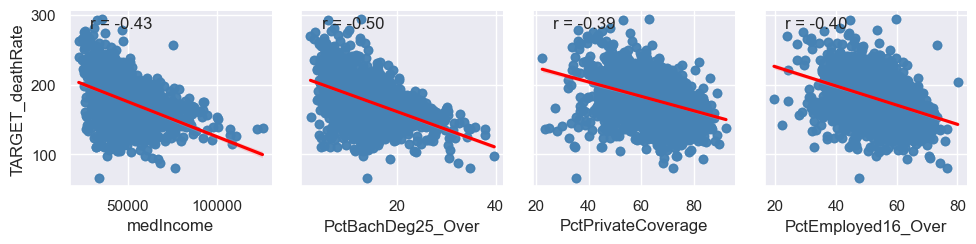

,TARGET_deathRate,PctPrivateCoverage,PctEmployed16_Over,medIncome,PctBachDeg25_Over
0,261.0,44.8,37.3,29090,4.3
1,167.3,27.2,31.7,29782,6.4
2,191.0,67.4,48.5,41955,10.2
3,165.4,70.9,57.1,55378,10.6
4,160.6,54.8,28.6,26309,5.9


In [27]:
# Create scatter plots for the negatively correlated features with the target variable.
# Create scatter plots of TARGET_deathrate vs PctPrivateCoverage, PctEmployed16_Over, medIncome, PctBachDeg25_Over.

sns.set()
cols = ['medIncome','PctBachDeg25_Over','PctPrivateCoverage','PctEmployed16_Over']
g = sns.PairGrid(cancer_df_clean, y_vars=['TARGET_deathRate'], x_vars=cols, height=2.5)
g.map(regplot_with_corr, color='steelblue', line_kws={'color': 'red'})
plt.show()

# Create a new dataframe with the features that have a correlation of -0.5 or less with the target variable.

cancer_df_clean_neg_cor = cancer_df_clean[['TARGET_deathRate','PctPrivateCoverage','PctEmployed16_Over','medIncome','PctBachDeg25_Over']]
cancer_df_clean_neg_cor.head()


> ### Insights

Key relationships worth acknowledging (all relationships share a ~0.4 correlation, so none are definitive):

- The higher covered by public health insurance alone, the higher the target death rate.

- The higher the poverty percentage, the higher the target death rate.

- The higher the unemployment rate (over 16), the higher the target death rate.

- The higher the median income, the lower the target death rate.

- The higher degree of education, the lower the target death rate.

- The more private health insurance coverage, the lower the target death rate.

<br>

- Incidence Rate is a good feature to use for the model, as it has a stronger positive correlation with the target variable.

- Poverty Percentage, is also a good feature to use for the model, as it has a stronger positive correlation with the target variable.

<br>
<br>
<br>
<br>
<br>

 # Modelling - Univariate Linear Regression


##### Splitting the Data back into Training and Testing Sets

In [28]:
# Split the cancer_df datframe into training 80% data and testing set 20% data.

from sklearn.model_selection import train_test_split

cancer_train_df, cancer_test_df = train_test_split(cancer_df_clean, test_size=0.2, random_state=42)

##### Experimenting with a Univariate Linear Regression Model on the Target Variable and incidenceRate; using the altair library.

In [29]:
# Visualise with target death rate and incidence rate altair packages, removing outliers. Call this chart scatter_chart_IR_TDR

import altair as alt

scatter_chart_IR_TDR = alt.Chart(cancer_train_df).mark_circle().encode(
    x='incidenceRate',
    y='TARGET_deathRate',
    tooltip=['incidenceRate', 'TARGET_deathRate']
).interactive()

scatter_chart_IR_TDR

alt.Chart(...)

> ### Insights

- Outlier has been included, as it represents a real-world scenario.

In [30]:
# Extract the features and target from the incidenceRate dataset with the removed outlier, respectively into 2 variables called X and y.

X_IR = cancer_train_df['incidenceRate'].values
y_IR = cancer_train_df['TARGET_deathRate'].values

In [31]:
# Calculate the average value of the target variable and save it into a variable called y_mean.

y_IR_mean = y_IR.mean()
print("y mean:", y_IR_mean)

y mean: 178.54699637493528


In [32]:
# Create an array called y_base with the same number of rows and columns as the target variable and
# that only contains the value from y_mean.

y_IR_base = np.full((2436,1), y_IR_mean)

In [33]:
# Calculate the sum of errors between the target variable and the average value.

(y_IR_base - y_IR).sum()
print("Sum of errors:", (y_IR_base - y_IR).sum())

Sum of errors: 8.543986496079015e-08


In [34]:
# Import the linear regression module from sklearn.
# Instantiate the LinearRegression class into a variable called reg

from sklearn.linear_model import LinearRegression 
reg_IR = LinearRegression()

In [35]:
#Fit the model with the training data.

reg_IR.fit(X_IR.reshape(-1,1), y_IR)

LinearRegression()

##### Analyse Model's Performance

In [36]:
# Use the trained model to predict the outcome for all observations and save them into a variable called y_preds.

y_IR_preds = reg_IR.predict(X_IR.reshape(-1, 1))

In [37]:
# Calculate the sum of errors between the target variable and the predictions

(y_IR_preds - y_IR).sum()
print("Sum of errors:", (y_IR_preds - y_IR).sum())

Sum of errors: 1.9554136088117957e-11


In [38]:
# Create a line chart for the predictions. Call this chart line_chart_IR_TDR.

line_chart_IR_TDR = alt.Chart(pd.DataFrame({'x': X_IR, 'y': y_IR_preds})).mark_line(color='red').encode(
    x='x',
    y='y'
  )

In [39]:
# Display the correlation between the target death rate and the incidence rate.

print("Correlation:", cancer_train_df['TARGET_deathRate'].corr(cancer_train_df['incidenceRate']))

# Display the combine scatter plot and line chart to compare predictions against the training data.

scatter_chart_IR_TDR + line_chart_IR_TDR


Correlation: 0.438660615786927


alt.LayerChart(...)

In [40]:
# Calculate the Pearson's correlation coefficient between target death rate and incidence rate.

from scipy.stats import pearsonr

pearsonr(cancer_train_df['TARGET_deathRate'], cancer_train_df['incidenceRate'])

# If pvalue less than 0.5, then the correlation is significant.


PearsonRResult(statistic=0.4386606157869268, pvalue=2.1423247854433537e-181)

In [41]:
# Calculate the MSE for the predictions.

from sklearn.metrics import mean_squared_error
mean_squared_error(y_IR, y_IR_preds)
print("MSE:", mean_squared_error(y_IR, y_IR_preds))


MSE: 599.5221289678522


In [42]:
# Calculate the MSE for the test data.

X_IR_test = cancer_test_df['incidenceRate'].values
y_IR_test = cancer_test_df['TARGET_deathRate'].values

y_IR_test_preds = reg_IR.predict(X_IR_test.reshape(-1, 1))

mean_squared_error(y_IR_test, y_IR_test_preds)
print("MSE:", mean_squared_error(y_IR_test, y_IR_test_preds))


MSE: 663.814713345012


##### Experimenting with a Univariate Linear Regression Model on the Target Variable and povertyPercent; using the altair library.

In [43]:
# Visualise with target death rate and Poverty Percentage with the altair library.

scatter_chart_IR_TDR = alt.Chart(cancer_train_df).mark_circle().encode(
    x='povertyPercent',
    y='TARGET_deathRate',
    tooltip=['povertyPercent', 'TARGET_deathRate']
).interactive()

scatter_chart_IR_TDR

alt.Chart(...)

In [44]:

# Extract the features and target from the incidenceRate dataset with the removed outlier, respectively into 2 variables called X and y.

X_IR = cancer_train_df['povertyPercent'].values
y_IR = cancer_train_df['TARGET_deathRate'].values

# Calculate the average value of the target variable and save it into a variable called y_mean.

y_IR_mean = y_IR.mean()
y_IR_mean

# Create an array called y_base with the same number of rows and columns as the target variable and
# that only contains the value from y_mean.

y_IR_base = np.full((2436,1), y_IR_mean)

# Calculate the sum of errors between the target variable and the average value.

(y_IR_base - y_IR).sum()

# Import the linear regression module from sklearn.
# Instantiate the LinearRegression class into a variable called reg

from sklearn.linear_model import LinearRegression 
reg_IR = LinearRegression()

#Fit the model with the training data.

reg_IR.fit(X_IR.reshape(-1,1), y_IR)

# Use the trained model to predict the outcome for all observations and save them into a variable called y_preds.

y_IR_preds = reg_IR.predict(X_IR.reshape(-1, 1))


# Calculate the sum of errors between the target variable and the predictions

(y_IR_preds - y_IR).sum()

# Create a line chart for the predictions. Call this chart line_chart_IR_TDR.

line_chart_IR_TDR = alt.Chart(pd.DataFrame({'x': X_IR, 'y': y_IR_preds})).mark_line(color='red').encode(
    x='x',
    y='y'
  )

# Display the correlation between the target death rate and the incidence rate.

print("Correlation:", cancer_train_df['TARGET_deathRate'].corr(cancer_train_df['povertyPercent']))

# Display the combine scatter plot and line chart to compare predictions against the training data.

scatter_chart_IR_TDR + line_chart_IR_TDR



Correlation: 0.45226662902053255


alt.LayerChart(...)

In [45]:
# Calculate the MSE for the predictions.

from sklearn.metrics import mean_squared_error
mean_squared_error(y_IR, y_IR_preds)


590.5231242723719

In [46]:
# Calculate the MSE for the test data.

X_IR_test = cancer_test_df['povertyPercent'].values
y_IR_test = cancer_test_df['TARGET_deathRate'].values

y_IR_test_preds = reg_IR.predict(X_IR_test.reshape(-1, 1))

print("MSE:", mean_squared_error(y_IR_test, y_IR_test_preds))


MSE: 697.8404571198721


##### Insights

- With quite high MSE values, the model unfortunately does not perform well.

- Will investigate whether more comprehensive models will perform better in Parts B and C.

- End of Part A.
